In [1]:
!nvidia-smi

Thu Oct 19 23:03:24 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 522.06       Driver Version: 522.06       CUDA Version: 11.8     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:07:00.0  On |                  N/A |
|  0%   42C    P3    21W / 130W |    951MiB /  8192MiB |     17%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import os
import ultralytics
ultralytics.checks()

from ultralytics import YOLO
import numpy as np
from tensorflow import keras
from gradcam import GradCAM
import torchvision.models as models
import torch.nn as nn
from torch.nn import TransformerEncoder, TransformerEncoderLayer
from torchvision.models.resnet import ResNet152_Weights

Ultralytics YOLOv8.0.199  Python-3.10.13 torch-2.0.0+cpu CPU (AMD Ryzen 5 5600X 6-Core Processor)
Setup complete  (12 CPUs, 31.9 GB RAM, 357.3/465.0 GB disk)


In [3]:
# Datasets
DATASET_DIR = 'C:/Users/Duc Anh/Desktop/Activity-Recogntion/datasets/Human Activity Recognition - Video Dataset'
CLASSES_LIST = sorted([entry.name for entry in os.scandir(DATASET_DIR) if entry.is_dir()])
print(CLASSES_LIST)

['Clapping', 'Meet and Split', 'Sitting', 'Standing Still', 'Walking', 'Walking While Reading Book', 'Walking While Using Phone']


In [4]:
%cd "C:/Users/Duc Anh/Desktop/Activity-Recogntion/final/"

# Initialize YOLO model
yolo_model = YOLO('yolov8x.pt')
# yolo_model.to('cuda')

# For spatial features
spatial_resnet_full = models.resnet152(weights=ResNet152_Weights.IMAGENET1K_V1)
spatial_resnet = nn.Sequential(*list(spatial_resnet_full.children())[:-1])  # Retains the ResNet structure without the classifier
spatial_resnet.eval()

# For temporal features
temporal_resnet_full = models.resnet152(weights=ResNet152_Weights.IMAGENET1K_V1)
temporal_resnet = nn.Sequential(*list(temporal_resnet_full.children())[:-1])
temporal_resnet.eval()


# Define Transformer Encoders
# fewer attention heads for spatial model
spatial_encoder_layers = TransformerEncoderLayer(d_model=2048, nhead=4)  # fewer attention heads for spatial model
spatial_transformer = TransformerEncoder(spatial_encoder_layers, num_layers=2)

# more attention heads for temporal model
temporal_encoder_layers = TransformerEncoderLayer(d_model=2048, nhead=16)  # more attention heads for temporal model
temporal_transformer = TransformerEncoder(temporal_encoder_layers, num_layers=2)

# Load trained model
# Load the state dict previously saved 
dense_model_name = 'dense_model.h5'
dense_model = keras.models.load_model(dense_model_name)

lstm_model_name = 'lstm_model.h5'
lstm_model = keras.models.load_model(lstm_model_name)

cnn_model_name = 'cnn_model.h5'
cnn_model = keras.models.load_model(cnn_model_name)

# Initialize GradCAM with the ResNet model and the target layer
target_layer = spatial_resnet_full.layer4[-1]
grad_cam = GradCAM(spatial_resnet_full, target_layer)

C:\Users\Duc Anh\Desktop\Activity-Recogntion\final


In [5]:
video_path = 'C:/Users/Duc Anh/Desktop/Activity-Recogntion/final/videos/reallife.mp4'
output_video = 'reallife.mp4'


0: 384x640 3 persons, 595.2ms
Speed: 1.0ms preprocess, 595.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 1, Frames buffer: 1, Rois buffer: 1
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 1, Frames buffer: 1, Rois buffer: 1
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id 3
Fuse features for id 3
Appending buffers for id 

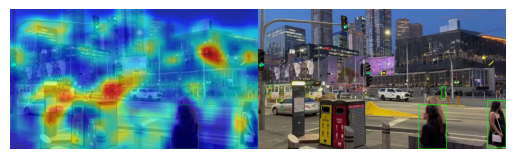


0: 384x640 3 persons, 598.2ms
Speed: 1.0ms preprocess, 598.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 2, Frames buffer: 2, Rois buffer: 2
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 2, Frames buffer: 2, Rois buffer: 2
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id 3
Fuse features for id 3
Appending buffers for id 

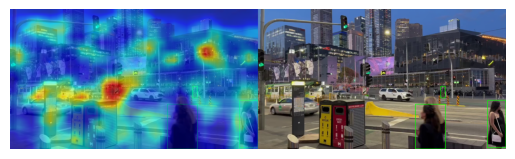


0: 384x640 3 persons, 531.6ms
Speed: 2.0ms preprocess, 531.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 3, Frames buffer: 3, Rois buffer: 3
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 3, Frames buffer: 3, Rois buffer: 3
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id 3
Fuse features for id 3
Appending buffers for id 

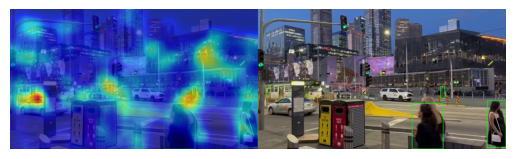


0: 384x640 3 persons, 585.8ms
Speed: 2.0ms preprocess, 585.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 4, Frames buffer: 4, Rois buffer: 4
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 4, Frames buffer: 4, Rois buffer: 4
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id 3
Fuse features for id 3
Appending buffers for id 

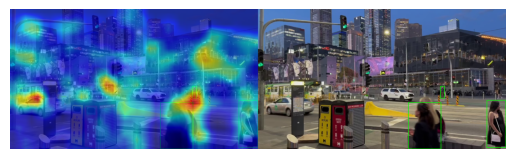


0: 384x640 3 persons, 539.1ms
Speed: 1.0ms preprocess, 539.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 5, Frames buffer: 5, Rois buffer: 5
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 5, Frames buffer: 5, Rois buffer: 5
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id 3
Fuse features for id 3
Appending buffers for id 

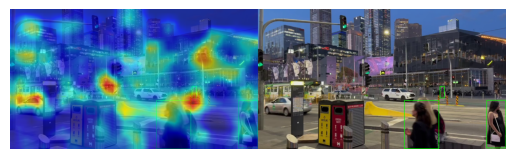


0: 384x640 3 persons, 591.7ms
Speed: 1.0ms preprocess, 591.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 6, Frames buffer: 6, Rois buffer: 6
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 6, Frames buffer: 6, Rois buffer: 6
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id 3
Fuse features for id 3
Appending buffers for id 

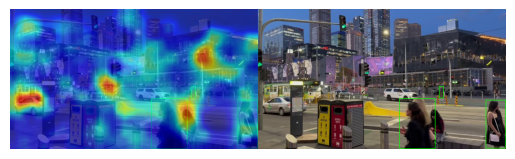


0: 384x640 4 persons, 603.8ms
Speed: 2.0ms preprocess, 603.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 7, Frames buffer: 7, Rois buffer: 7
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 7, Frames buffer: 7, Rois buffer: 7
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id 3
Fus

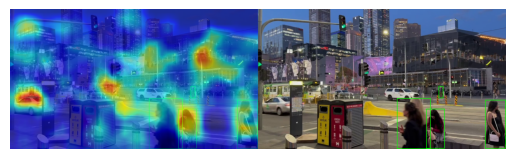


0: 384x640 4 persons, 594.1ms
Speed: 2.0ms preprocess, 594.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 8, Frames buffer: 8, Rois buffer: 8
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 8, Frames buffer: 8, Rois buffer: 8
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id 3
Fus

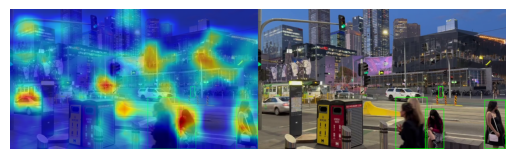


0: 384x640 4 persons, 582.7ms
Speed: 1.0ms preprocess, 582.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 9, Frames buffer: 9, Rois buffer: 9
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 9, Frames buffer: 9, Rois buffer: 9
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id 3
Fus

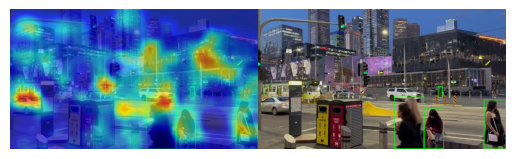


0: 384x640 4 persons, 575.2ms
Speed: 1.0ms preprocess, 575.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 10, Frames buffer: 10, Rois buffer: 10
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 10, Frames buffer: 10, Rois buffer: 10
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id

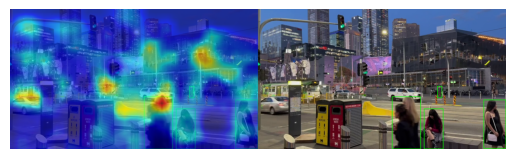


0: 384x640 4 persons, 621.2ms
Speed: 1.0ms preprocess, 621.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 11, Frames buffer: 11, Rois buffer: 11
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 11, Frames buffer: 11, Rois buffer: 11
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id

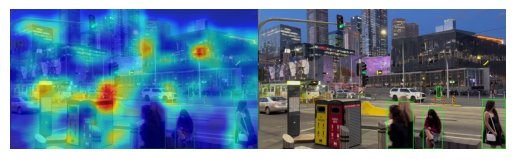


0: 384x640 4 persons, 570.2ms
Speed: 1.0ms preprocess, 570.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 12, Frames buffer: 12, Rois buffer: 12
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 12, Frames buffer: 12, Rois buffer: 12
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id

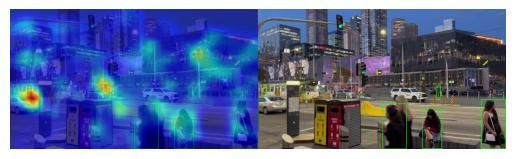


0: 384x640 4 persons, 602.2ms
Speed: 2.0ms preprocess, 602.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 13, Frames buffer: 13, Rois buffer: 13
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 13, Frames buffer: 13, Rois buffer: 13
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting Features for id 3
Transforming features for id

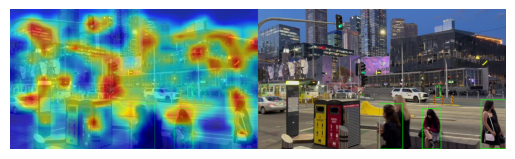


0: 384x640 5 persons, 542.2ms
Speed: 1.0ms preprocess, 542.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 14, Frames buffer: 14, Rois buffer: 14
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 14, Frames buffer: 14, Rois buffer: 14
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting F

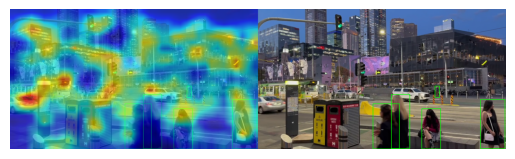


0: 384x640 5 persons, 597.2ms
Speed: 1.0ms preprocess, 597.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 15, Frames buffer: 15, Rois buffer: 15
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 15, Frames buffer: 15, Rois buffer: 15
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting F

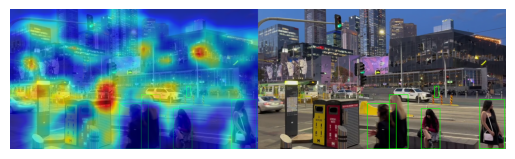


0: 384x640 5 persons, 598.5ms
Speed: 2.0ms preprocess, 598.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 16, Frames buffer: 16, Rois buffer: 16
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 16, Frames buffer: 16, Rois buffer: 16
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting F

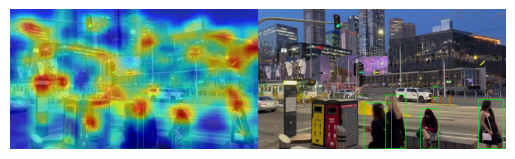


0: 384x640 5 persons, 600.2ms
Speed: 1.0ms preprocess, 600.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 17, Frames buffer: 17, Rois buffer: 17
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 17, Frames buffer: 17, Rois buffer: 17
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting F

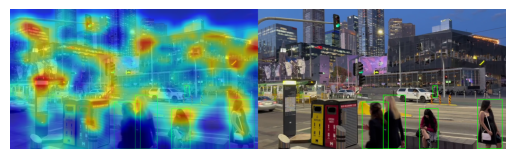


0: 384x640 5 persons, 586.2ms
Speed: 1.0ms preprocess, 586.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 18, Frames buffer: 18, Rois buffer: 18
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 18, Frames buffer: 18, Rois buffer: 18
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting F

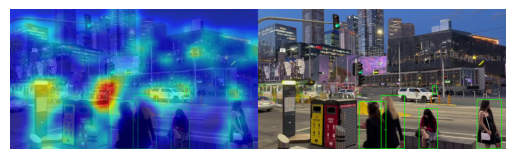


0: 384x640 5 persons, 555.6ms
Speed: 1.0ms preprocess, 555.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 19, Frames buffer: 19, Rois buffer: 19
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 19, Frames buffer: 19, Rois buffer: 19
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting F

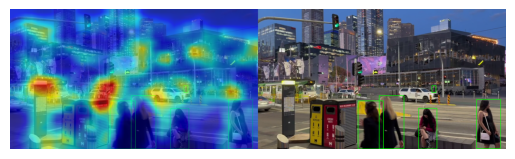


0: 384x640 5 persons, 560.1ms
Speed: 1.0ms preprocess, 560.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 20, Frames buffer: 20, Rois buffer: 20
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 20, Frames buffer: 20, Rois buffer: 20
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting F

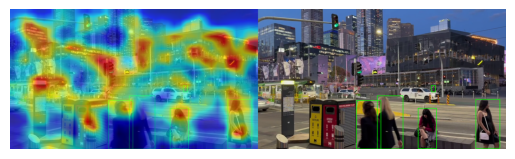


0: 384x640 5 persons, 619.1ms
Speed: 2.0ms preprocess, 619.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 21, Frames buffer: 21, Rois buffer: 21
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 21, Frames buffer: 21, Rois buffer: 21
Processing id: 3
Draw Skeleton for id 3
Draw  Boxes for id 3
Processing Heatmap for id 3
Processing ROI for id 3
Processing frame for id 3
Extracting F

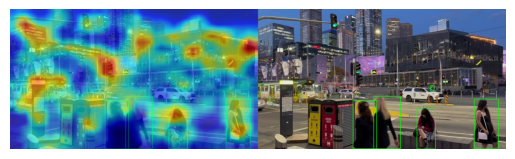


0: 384x640 4 persons, 606.2ms
Speed: 1.5ms preprocess, 606.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 22, Frames buffer: 22, Rois buffer: 22
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 22, Frames buffer: 22, Rois buffer: 22
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting Features for id 5
Transforming features for id

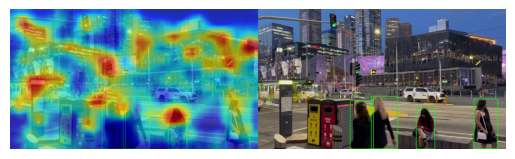


0: 384x640 4 persons, 597.0ms
Speed: 1.0ms preprocess, 597.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 23, Frames buffer: 23, Rois buffer: 23
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 23, Frames buffer: 23, Rois buffer: 23
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting Features for id 5
Transforming features for id

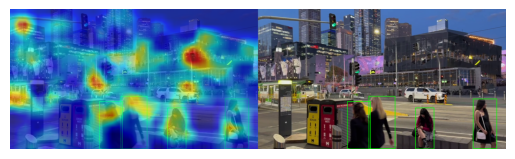


0: 384x640 4 persons, 585.7ms
Speed: 2.5ms preprocess, 585.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 24, Frames buffer: 24, Rois buffer: 24
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 24, Frames buffer: 24, Rois buffer: 24
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting Features for id 5
Transforming features for id

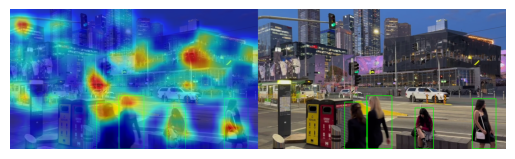


0: 384x640 4 persons, 594.7ms
Speed: 1.0ms preprocess, 594.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 25, Frames buffer: 25, Rois buffer: 25
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 25, Frames buffer: 25, Rois buffer: 25
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting Features for id 5
Transforming features for id

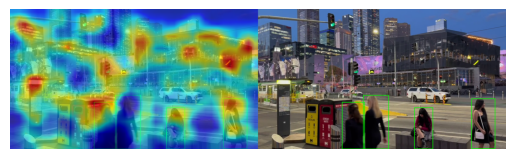


0: 384x640 5 persons, 539.7ms
Speed: 1.0ms preprocess, 539.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 26, Frames buffer: 26, Rois buffer: 26
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 26, Frames buffer: 26, Rois buffer: 26
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting F

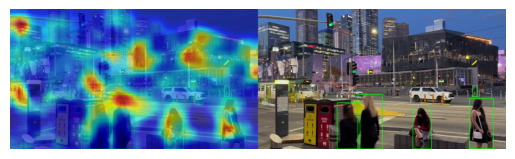


0: 384x640 5 persons, 605.2ms
Speed: 1.0ms preprocess, 605.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 27, Frames buffer: 27, Rois buffer: 27
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 27, Frames buffer: 27, Rois buffer: 27
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting F

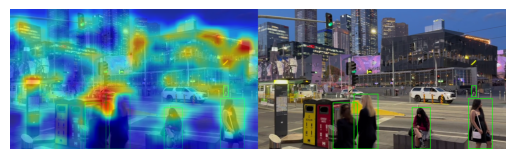


0: 384x640 5 persons, 612.4ms
Speed: 2.0ms preprocess, 612.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 28, Frames buffer: 28, Rois buffer: 28
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 28, Frames buffer: 28, Rois buffer: 28
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting F

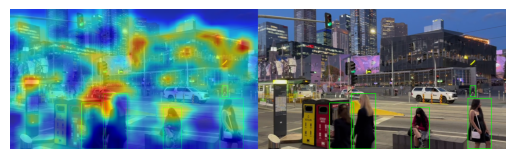


0: 384x640 5 persons, 578.2ms
Speed: 1.0ms preprocess, 578.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 29, Frames buffer: 29, Rois buffer: 29
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 29, Frames buffer: 29, Rois buffer: 29
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting F

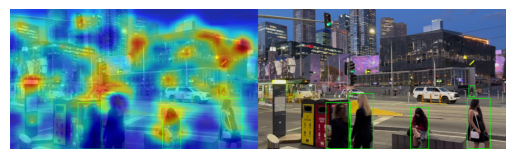


0: 384x640 5 persons, 550.2ms
Speed: 2.0ms preprocess, 550.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 30, Frames buffer: 30, Rois buffer: 30
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 30, Frames buffer: 30, Rois buffer: 30
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting F

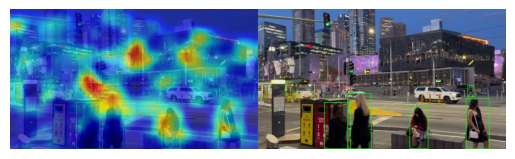


0: 384x640 5 persons, 565.3ms
Speed: 1.0ms preprocess, 565.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 31, Frames buffer: 31, Rois buffer: 31
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 31, Frames buffer: 31, Rois buffer: 31
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting F

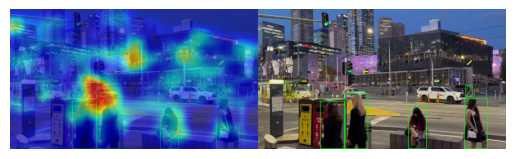


0: 384x640 4 persons, 612.2ms
Speed: 1.0ms preprocess, 612.2ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 32, Frames buffer: 32, Rois buffer: 32
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 32, Frames buffer: 32, Rois buffer: 32
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting Features for id 5
Transforming features for id

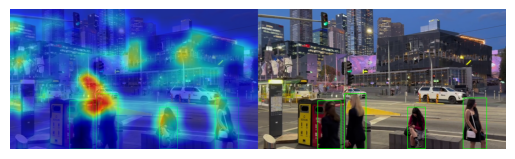


0: 384x640 4 persons, 607.8ms
Speed: 1.0ms preprocess, 607.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 33, Frames buffer: 33, Rois buffer: 33
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 33, Frames buffer: 33, Rois buffer: 33
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting Features for id 5
Transforming features for id

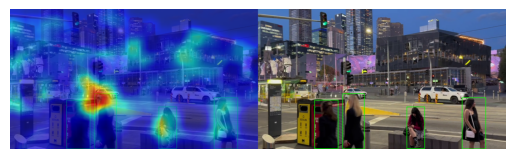


0: 384x640 5 persons, 588.2ms
Speed: 2.0ms preprocess, 588.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 34, Frames buffer: 34, Rois buffer: 34
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 34, Frames buffer: 34, Rois buffer: 34
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting F

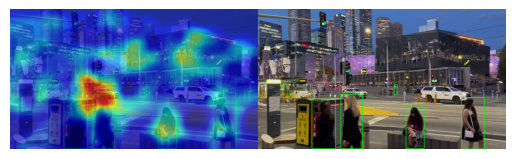


0: 384x640 5 persons, 557.2ms
Speed: 1.0ms preprocess, 557.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 35, Frames buffer: 35, Rois buffer: 35
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 35, Frames buffer: 35, Rois buffer: 35
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting F

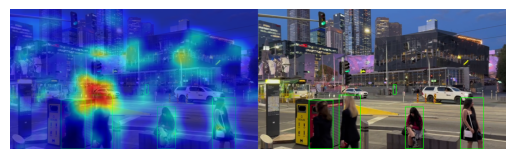


0: 384x640 5 persons, 608.1ms
Speed: 1.0ms preprocess, 608.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 36, Frames buffer: 36, Rois buffer: 36
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 36, Frames buffer: 36, Rois buffer: 36
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting F

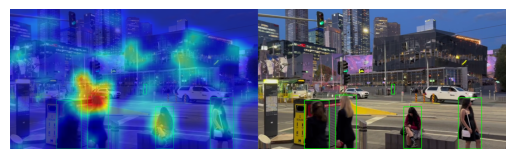


0: 384x640 5 persons, 611.2ms
Speed: 2.0ms preprocess, 611.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 37, Frames buffer: 37, Rois buffer: 37
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 37, Frames buffer: 37, Rois buffer: 37
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting F

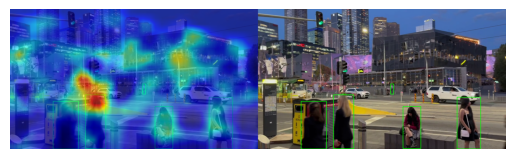


0: 384x640 5 persons, 612.5ms
Speed: 1.0ms preprocess, 612.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 38, Frames buffer: 38, Rois buffer: 38
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 38, Frames buffer: 38, Rois buffer: 38
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting F

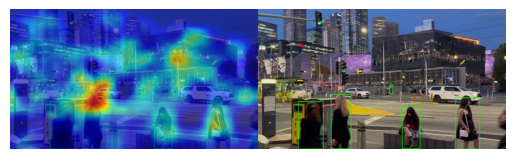


0: 384x640 6 persons, 602.1ms
Speed: 1.0ms preprocess, 602.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 39, Frames buffer: 39, Rois buffer: 39
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 39, Frames buffer: 39, Rois buffer: 39
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI fo

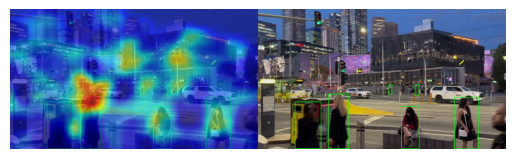


0: 384x640 6 persons, 612.2ms
Speed: 2.0ms preprocess, 612.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 40, Frames buffer: 40, Rois buffer: 40
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 40, Frames buffer: 40, Rois buffer: 40
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI fo

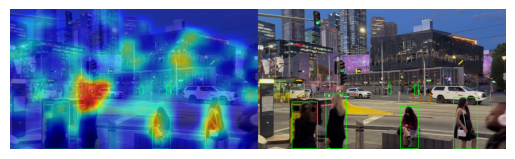


0: 384x640 6 persons, 592.2ms
Speed: 1.0ms preprocess, 592.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 41, Frames buffer: 41, Rois buffer: 41
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 41, Frames buffer: 41, Rois buffer: 41
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI fo

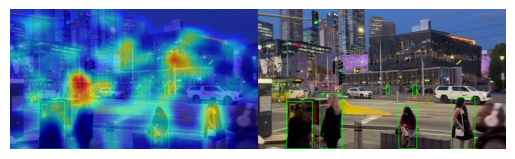


0: 384x640 7 persons, 599.2ms
Speed: 1.0ms preprocess, 599.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 42, Frames buffer: 42, Rois buffer: 42
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 42, Frames buffer: 42, Rois buffer: 42
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5


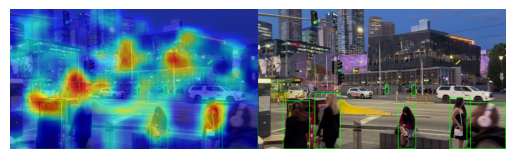


0: 384x640 7 persons, 607.3ms
Speed: 2.0ms preprocess, 607.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 43, Frames buffer: 43, Rois buffer: 43
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 43, Frames buffer: 43, Rois buffer: 43
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5


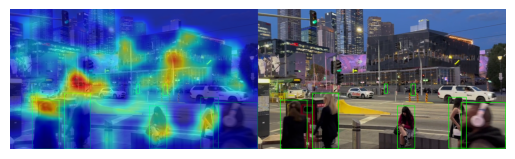


0: 384x640 7 persons, 567.2ms
Speed: 1.0ms preprocess, 567.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 1
Draw Skeleton for id 1
Draw  Boxes for id 1
Processing Heatmap for id 1
Processing ROI for id 1
Processing frame for id 1
Extracting Features for id 1
Transforming features for id 1
Fuse features for id 1
Appending buffers for id 1
Id: 1, Feautres buffer: 44, Frames buffer: 44, Rois buffer: 44
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 44, Frames buffer: 44, Rois buffer: 44
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5


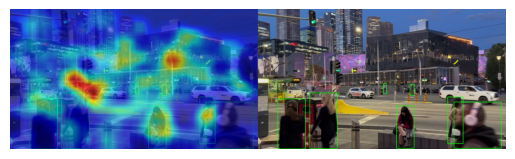


0: 384x640 5 persons, 600.2ms
Speed: 1.0ms preprocess, 600.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 45, Frames buffer: 45, Rois buffer: 45
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting Features for id 5
Transforming features for id 5
Fuse features for id 5
Appending buffers for id 5
Id: 5, Feautres buffer: 39, Frames buffer: 39, Rois buffer: 39
Processing id: 6
Draw Skeleton for id 6
Draw  Boxes for id 6
Processing Heatmap for id 6
Processing ROI for id 6
Processing frame for id 6
Extracting F

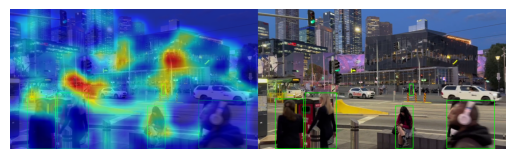


0: 384x640 5 persons, 600.2ms
Speed: 2.0ms preprocess, 600.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 46, Frames buffer: 46, Rois buffer: 46
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting Features for id 5
Transforming features for id 5
Fuse features for id 5
Appending buffers for id 5
Id: 5, Feautres buffer: 40, Frames buffer: 40, Rois buffer: 40
Processing id: 6
Draw Skeleton for id 6
Draw  Boxes for id 6
Processing Heatmap for id 6
Processing ROI for id 6
Processing frame for id 6
Extracting F

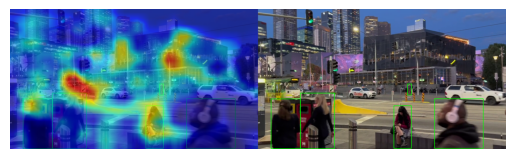


0: 384x640 5 persons, 597.2ms
Speed: 1.0ms preprocess, 597.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 47, Frames buffer: 47, Rois buffer: 47
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting Features for id 5
Transforming features for id 5
Fuse features for id 5
Appending buffers for id 5
Id: 5, Feautres buffer: 41, Frames buffer: 41, Rois buffer: 41
Processing id: 6
Draw Skeleton for id 6
Draw  Boxes for id 6
Processing Heatmap for id 6
Processing ROI for id 6
Processing frame for id 6
Extracting F

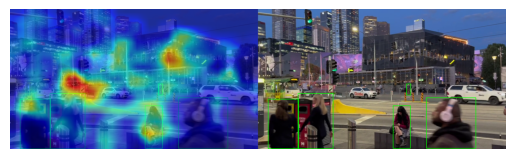


0: 384x640 5 persons, 718.7ms
Speed: 2.0ms preprocess, 718.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 48, Frames buffer: 48, Rois buffer: 48
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting Features for id 5
Transforming features for id 5
Fuse features for id 5
Appending buffers for id 5
Id: 5, Feautres buffer: 42, Frames buffer: 42, Rois buffer: 42
Processing id: 6
Draw Skeleton for id 6
Draw  Boxes for id 6
Processing Heatmap for id 6
Processing ROI for id 6
Processing frame for id 6
Extracting F

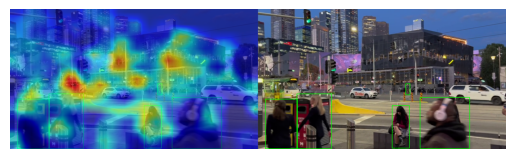


0: 384x640 5 persons, 617.1ms
Speed: 2.0ms preprocess, 617.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 49, Frames buffer: 49, Rois buffer: 49
Processing id: 5
Draw Skeleton for id 5
Draw  Boxes for id 5
Processing Heatmap for id 5
Processing ROI for id 5
Processing frame for id 5
Extracting Features for id 5
Transforming features for id 5
Fuse features for id 5
Appending buffers for id 5
Id: 5, Feautres buffer: 43, Frames buffer: 43, Rois buffer: 43
Processing id: 6
Draw Skeleton for id 6
Draw  Boxes for id 6
Processing Heatmap for id 6
Processing ROI for id 6
Processing frame for id 6
Extracting F

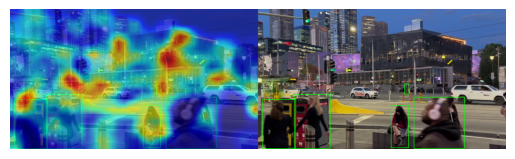


0: 384x640 6 persons, 579.5ms
Speed: 1.0ms preprocess, 579.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 50, Frames buffer: 50, Rois buffer: 50
Start Prediction Process
Converting Buffers to Numpy
1/1 [==============================] - 0s 64ms/step
Soft Vote: Walking While Using Phone
Hard Vote: Walking While Using Phone

Model: LSTM
Clapping: 0.23%
Meet and Split: 1.39%
Sitting: 1.63%
Standing Still: 0.51%
Walking: 0.17%
Walking While Reading Book: 29.72%
Walking While Using Phone: 66.35%

Model: Dense
Clapping: 0.44%
Meet and Split: 1.77%
Sitting: 0.33%


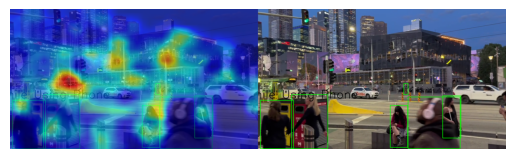


0: 384x640 6 persons, 577.3ms
Speed: 1.0ms preprocess, 577.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 50, Frames buffer: 50, Rois buffer: 50
Start Prediction Process
Converting Buffers to Numpy
1/1 [==============================] - 0s 61ms/step
Soft Vote: Walking While Using Phone
Hard Vote: Walking While Using Phone

Model: LSTM
Clapping: 0.26%
Meet and Split: 1.56%
Sitting: 1.81%
Standing Still: 0.55%
Walking: 0.18%
Walking While Reading Book: 29.48%
Walking While Using Phone: 66.17%

Model: Dense
Clapping: 0.35%
Meet and Split: 0.96%
Sitting: 0.25%


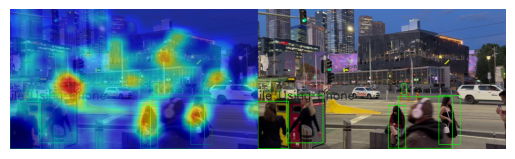


0: 384x640 7 persons, 555.2ms
Speed: 2.0ms preprocess, 555.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 50, Frames buffer: 50, Rois buffer: 50
Start Prediction Process
Converting Buffers to Numpy
1/1 [==============================] - 0s 77ms/step
Soft Vote: Walking While Using Phone
Hard Vote: Walking While Using Phone

Model: LSTM
Clapping: 0.29%
Meet and Split: 1.81%
Sitting: 2.06%
Standing Still: 0.61%
Walking: 0.20%
Walking While Reading Book: 29.60%
Walking While Using Phone: 65.44%

Model: Dense
Clapping

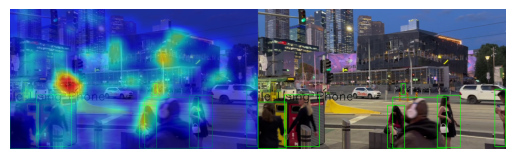


0: 384x640 7 persons, 568.8ms
Speed: 0.0ms preprocess, 568.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 50, Frames buffer: 50, Rois buffer: 50
Start Prediction Process
Converting Buffers to Numpy
1/1 [==============================] - 0s 59ms/step
Soft Vote: Walking While Using Phone
Hard Vote: Walking While Using Phone

Model: LSTM
Clapping: 0.33%
Meet and Split: 2.15%
Sitting: 2.32%
Standing Still: 0.67%
Walking: 0.22%
Walking While Reading Book: 30.05%
Walking While Using Phone: 64.26%

Model: Dense
Clapping

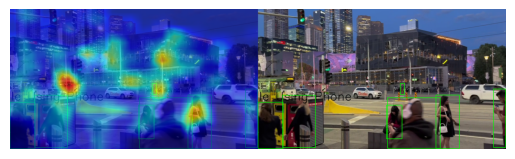


0: 384x640 7 persons, 563.4ms
Speed: 1.0ms preprocess, 563.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 50, Frames buffer: 50, Rois buffer: 50
Start Prediction Process
Converting Buffers to Numpy
1/1 [==============================] - 0s 61ms/step
Soft Vote: Walking While Using Phone
Hard Vote: Walking While Using Phone

Model: LSTM
Clapping: 0.37%
Meet and Split: 2.56%
Sitting: 2.61%
Standing Still: 0.74%
Walking: 0.25%
Walking While Reading Book: 30.79%
Walking While Using Phone: 62.68%

Model: Dense
Clapping

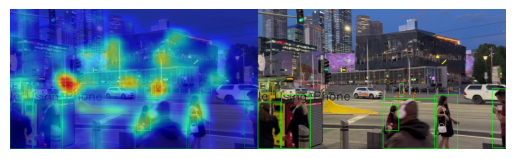


0: 384x640 7 persons, 591.6ms
Speed: 1.0ms preprocess, 591.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 50, Frames buffer: 50, Rois buffer: 50
Start Prediction Process
Converting Buffers to Numpy
1/1 [==============================] - 0s 61ms/step
Soft Vote: Walking While Using Phone
Hard Vote: Walking While Using Phone

Model: LSTM
Clapping: 0.42%
Meet and Split: 2.96%
Sitting: 2.88%
Standing Still: 0.81%
Walking: 0.29%
Walking While Reading Book: 31.46%
Walking While Using Phone: 61.19%

Model: Dense
Clapping

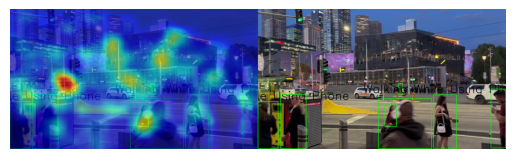


0: 384x640 6 persons, 586.1ms
Speed: 2.0ms preprocess, 586.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 50, Frames buffer: 50, Rois buffer: 50
Start Prediction Process
Converting Buffers to Numpy
1/1 [==============================] - 0s 68ms/step
Soft Vote: Walking While Using Phone
Hard Vote: Walking While Using Phone

Model: LSTM
Clapping: 0.46%
Meet and Split: 3.58%
Sitting: 3.24%
Standing Still: 0.87%
Walking: 0.32%
Walking While Reading Book: 31.66%
Walking While Using Phone: 59.87%

Model: Dense
Clapping: 0.41%
Meet and Split: 1.24%
Sitting: 0.29%


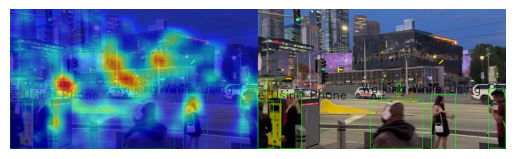


0: 384x640 6 persons, 609.2ms
Speed: 2.0ms preprocess, 609.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 50, Frames buffer: 50, Rois buffer: 50
Start Prediction Process
Converting Buffers to Numpy
1/1 [==============================] - 0s 63ms/step
Soft Vote: Walking While Using Phone
Hard Vote: Walking While Using Phone

Model: LSTM
Clapping: 0.51%
Meet and Split: 4.34%
Sitting: 3.70%
Standing Still: 0.94%
Walking: 0.35%
Walking While Reading Book: 32.06%
Walking While Using Phone: 58.09%

Model: Dense
Clapping: 0.42%
Meet and Split: 1.25%
Sitting: 0.33%


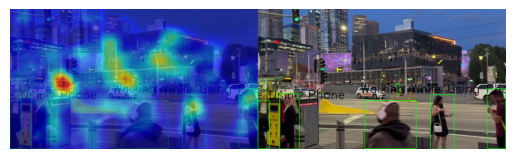


0: 384x640 6 persons, 593.2ms
Speed: 2.0ms preprocess, 593.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 50, Frames buffer: 50, Rois buffer: 50
Start Prediction Process
Converting Buffers to Numpy
1/1 [==============================] - 0s 65ms/step
Soft Vote: Walking While Using Phone
Hard Vote: Walking While Using Phone

Model: LSTM
Clapping: 0.57%
Meet and Split: 5.10%
Sitting: 4.50%
Standing Still: 1.03%
Walking: 0.39%
Walking While Reading Book: 32.84%
Walking While Using Phone: 55.58%

Model: Dense
Clapping: 0.37%
Meet and Split: 1.17%
Sitting: 0.27%


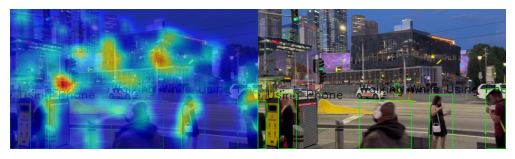


0: 384x640 6 persons, 593.0ms
Speed: 1.0ms preprocess, 593.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 50, Frames buffer: 50, Rois buffer: 50
Start Prediction Process
Converting Buffers to Numpy
1/1 [==============================] - 0s 69ms/step
Soft Vote: Walking While Using Phone
Hard Vote: Walking While Using Phone

Model: LSTM
Clapping: 0.60%
Meet and Split: 5.39%
Sitting: 5.18%
Standing Still: 1.10%
Walking: 0.41%
Walking While Reading Book: 34.16%
Walking While Using Phone: 53.16%

Model: Dense
Clapping: 0.44%
Meet and Split: 1.32%
Sitting: 0.30%


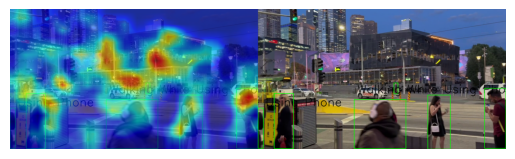


0: 384x640 6 persons, 606.5ms
Speed: 1.0ms preprocess, 606.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Extract rois
Extract keypoints using movenet
Processing id: 2
Draw Skeleton for id 2
Draw  Boxes for id 2
Processing Heatmap for id 2
Processing ROI for id 2
Processing frame for id 2
Extracting Features for id 2
Transforming features for id 2
Fuse features for id 2
Appending buffers for id 2
Id: 2, Feautres buffer: 50, Frames buffer: 50, Rois buffer: 50
Start Prediction Process
Converting Buffers to Numpy
1/1 [==============================] - 0s 62ms/step
Soft Vote: Walking While Using Phone
Hard Vote: Walking While Using Phone

Model: LSTM
Clapping: 0.63%
Meet and Split: 5.62%
Sitting: 6.27%
Standing Still: 1.17%
Walking: 0.42%
Walking While Reading Book: 34.94%
Walking While Using Phone: 50.94%

Model: Dense
Clapping: 0.43%
Meet and Split: 1.24%
Sitting: 0.31%


In [ ]:
from predict import predict_on_video
predict_on_video(video_path,
                 output_video,
                 CLASSES_LIST,
                 dense_model,
                 lstm_model,
                 cnn_model,
                 yolo_model,
                 spatial_resnet,
                 spatial_transformer,
                 temporal_resnet, 
                 temporal_transformer,
                 grad_cam,
                 SEQUENCE_LENGTH=50,
                 draw_skeleton=True,
                 draw_bbox=True,
                 debug=True)